# JBI100 Visualization 
### Academic year 2024-2025

## Incidents and Accidents
Data sources:

- Australian Shark Incidents (https://github.com/cjabradshaw/AustralianSharkIncidentDatabase)
- Railroad Incidents (https://data.transportation.gov/Railroads/Railroad-Equipment-Accident-Incident-Source-Data-F/aqxq-n5hy/about_data)
- Work-related Injury and Illness (https://www.osha.gov/Establishment-Specific-Injury-and-Illness-Data)

Data dictionaries and additional info can be found in the respective data folders.
Note: you only need to select one dataset for your project.

In [3]:
# Import libraries
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# Do not truncate tables
pd.set_option('display.max_columns', None)

# If you receive a 'ModuleNotFoundError' please install the according library. 
# This can be done from within the Jupyter environment with the command 
#'!python3 -m pip install lib' where lib is the according library name.

In [4]:
df_work = pd.read_csv('dataset.csv', delimiter=',', low_memory=False)

## Explore Shark Data

In [5]:
df_shark.sample(5)

,Incident.month,Incident.year,Victim.injury,State,Location,Latitude,Longitude,Site.category,Site.category.comment,Shark.common.name,Shark.scientific.name,Shark.identification.method,Shark.identification.source,Shark.length.m,Basis.for.length,Provoked/unprovoked,Provocative.act,No.sharks,Victim.activity,Fish.speared?,Commercial.dive.activity,Object.of.bite,Present.at.time.of.bite,Direction.first.strike,Shark.behaviour,Victim.aware.of.shark,Shark.captured,Injury.location,Injury.severity,Victim.gender,Victim.age,Victim.clothing,Clothing.coverage,Dominant.clothing.colour,Other.clothing.colour,Clothing.pattern,Fin.colour,Diversionary.action.taken,Diversionary.action.outcome,People <3m,People 3-15m,Time.of.incident,Depth.of.incident.m,Teeth.recovered,Time.in.water.min,Water.temperature.°C,Total.water.depth.m,Water.visability.m,Distance.to.shore.m,Spring.or.neap.tide,Tidal.cycle,Wind.condition,Weather.condition,Air.temperature.°C,Personal.protective.device,Deterrent.brand.and.type,Data.source,Reference,Unnamed: 59
UIN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1211,12,2022,injury,NSW,front beach cresent head,-31.189701,138.5179,coastal,NaN,white shark,Carcharodon carcharias,NaN,government official,1.6,NaN,unprovoked,NaN,1.0,swimming,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,leg,minor lacerations,male,15.0,boardshorts,NaN,black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1095,11,2018,fatal,QLD,"cid harbour, whitsundays",-20.25,148.9333,coastal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unprovoked,NaN,1.0,boarding,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"leg, arm",NaN,male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
418,11,1948,injured,QLD,"torres strait, saibai island",-9.633333,142.683333,island open ocean,NaN,tiger shark,Galeocerdo cuvier,"bite analysis, shark behaviour, geographical l...",NaN,NaN,NaN,provoked,NaN,1.0,snorkelling,NaN,Y,NaN,NaN,NaN,bit leg,N,NaN,leg,major lacerations,male,41.0,NaN,NaN,NaN,NaN,NaN,NaN,gouged sharks eye,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,media outlet,cairns post 20.11.1948,NaN
403,1,1946,injured,QLD,townsville,-19.25,146.816667,coastal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unprovoked,NaN,1.0,swimming,NaN,NaN,NaN,swimming,NaN,bit victim on foot,N,NaN,foot,minor lacerations,male,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,media outlet,coppleson 1958 & townsville daily bulletin 19....,NaN
916,5,2011,injured,NSW,big seal rocks,-32.45,152.533333,coastal,NaN,wobbegong,Orectolobidae,direct observation,witness/victim,1.0,witness/victim,provoked,physical contact,1.0,diving,NaN,NaN,NaN,"scuba diving, baitfish, other sealife (turtle/...",NaN,bit leg - thigh,Y,NaN,thigh,other: teeth marks,female,NaN,wetsuit/drysuit,full body,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0,NaN,3.0,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,witness account,email 1.6.2012 (awaiting questionnaire),NaN


In [6]:
df_shark.describe()

,Incident.month,Incident.year,Shark.length.m,No.sharks,Victim.age,People <3m,People 3-15m,Time.of.incident,Depth.of.incident.m,Time.in.water.min,Water.temperature.°C,Total.water.depth.m,Water.visability.m,Distance.to.shore.m,Spring.or.neap.tide,Air.temperature.°C,Unnamed: 59
count,1233.000000,1233.000000,590.000000,1140.000000,723.000000,97.000000,83.000000,522.000000,520.000000,230.000000,91.000000,228.000000,70.000000,360.000000,0.0,40.000000,1.0
mean,5.939984,1968.518248,2.696855,1.034211,28.269710,1.556701,3.289157,1281.689655,2.130000,59.370000,20.981319,5.961404,10.371429,3176.019444,NaN,24.175000,415438758.0
std,4.084692,48.451842,1.206209,0.342569,13.963268,1.561043,5.511695,409.954877,5.474775,253.578818,4.127090,9.286013,22.023815,21519.531041,NaN,4.914069,NaN
min,1.000000,1791.000000,0.300000,1.000000,0.000000,0.000000,0.000000,130.000000,0.000000,0.100000,0.300000,0.500000,0.000000,1.000000,NaN,10.000000,415438758.0
25%,2.000000,1933.000000,1.800000,1.000000,17.000000,1.000000,1.000000,933.750000,0.000000,3.000000,19.000000,1.000000,1.000000,30.000000,NaN,22.000000,415438758.0
50%,5.000000,1986.000000,2.600000,1.000000,25.000000,1.000000,2.000000,1300.000000,0.000000,10.000000,21.000000,2.000000,5.000000,80.000000,NaN,25.000000,415438758.0
75%,10.000000,2011.000000,3.500000,1.000000,37.000000,2.000000,3.000000,1620.000000,1.000000,30.000000,23.000000,7.000000,10.000000,200.000000,NaN,27.000000,415438758.0
max,12.000000,2024.000000,6.000000,10.000000,84.000000,12.000000,40.000000,2330.000000,45.000000,2160.000000,29.000000,80.000000,150.000000,280000.000000,NaN,35.000000,415438758.0


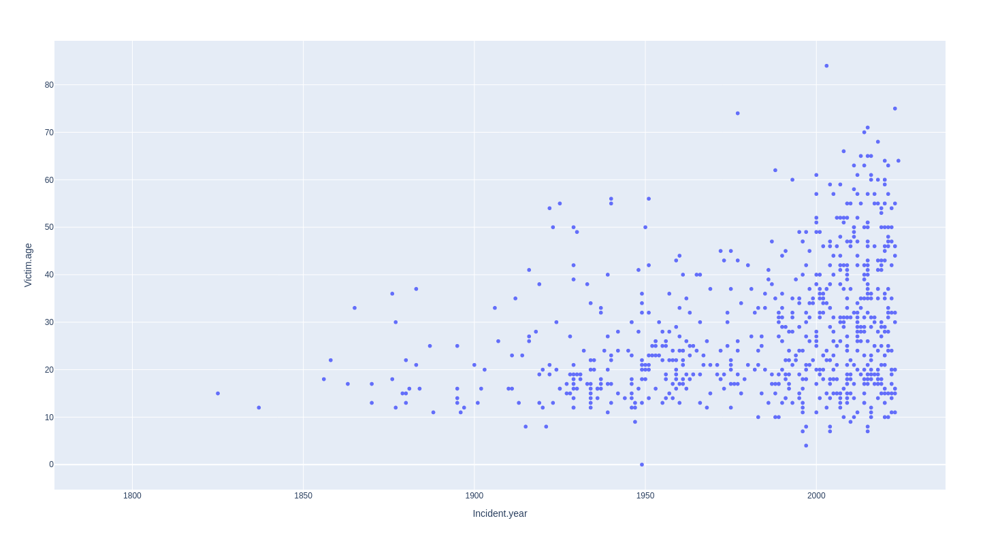

In [9]:
fig = px.scatter(df_shark, x="Incident.year", y="Victim.age",
                 width=1000, height=800)
fig.show()

## Explore Railroad Incident data

In [6]:
df_railroad.sample(5)

,IYR,IMO,RAILROAD,INCDTNO,IYR2,IMO2,RR2,INCDTNO2,IYR3,IMO3,RR3,INCDTNO3,DUMMY1,GXID,YEAR,MONTH,DAY,TIMEHR,TIMEMIN,AMPM,TYPE,CARS,CARSDMG,CARSHZD,EVACUATE,DIVISION,STATION,MILEPOST,STATE,TEMP,VISIBLTY,WEATHER,TRNSPD,TYPSPD,TRNNBR,TRNDIR,TONS,TYPEQ,EQATT,TRKNAME,TRKCLAS,TRKDNSTY,TYPTRK,RRCAR1,CARNBR1,POSITON1,LOADED1,RRCAR2,CARNBR2,POSITON2,LOADED2,HEADEND1,MIDMAN1,MIDREM1,RMAN1,RREM1,HEADEND2,MIDMAN2,MIDREM2,RMAN2,RREM2,LOADF1,LOADP1,EMPTYF1,EMPTYP1,CABOOSE1,LOADF2,LOADP2,EMPTYF2,EMPTYP2,CABOOSE2,EQPDMG,TRKDMG,CAUSE,CAUSE2,CASKLDRR,CASINJRR,CASKLD,CASINJ,ACCAUSE,ACCTRK,ACCTRKCL,HIGHSPD,ACCDMG,DUMMY2,STCNTY,TOTINJ,DUMMY3,TOTKLD,ENGRS,FIREMEN,CONDUCTR,BRAKEMEN,ENGHR,ENGMIN,CDTRHR,CDTRMIN,JOINTCD,REGION,DUMMY4,TYPRR,DUMMY5,RRDIV,METHOD,NARRLEN,DUMMY6,YEAR4,RREMPKLD,RREMPINJ,PASSKLD,PASSINJ,OTHERKLD,OTHERINJ,COUNTY,CNTYCD,ALCOHOL,DRUG,DUMMY7,PASSTRN,SSB1,SSB2,NARR1,NARR2,NARR3,NARR4,NARR5,NARR6,NARR7,NARR8,NARR9,NARR10,NARR11,NARR12,NARR13,NARR14,NARR15,RCL,Latitude,Longitud,SIGNAL,MOPERA,ADJUNCT1,ADJUNCT2,ADJUNCT3,SUBDIV
161693,77,5,PS,166X518,NaN,NaN,NaN,NaN,77.0,5.0,PS,166X518,NaN,NaN,77,5,13,2.0,25.0,AM,1.0,0,0,0,0,NaN,SPRANKLE,39.0,42,60,4.0,2.0,10.0,R,KGBV,1,2875,1,Y,MAIN,3,NaN,1,PS,001019,35.0,Y,PS,1019.0,35.0,Y,3,0,0,0,0,0,0,0,0,0,26,0,19,0,1,1,0,0,0,0,482.0,21054.0,E99C,NaN,0,0,0,0,E99C,1,3,10,21536.0,NaN,42C065,0,NaN,0,1.0,1.0,1.0,2.0,6.0,24.0,6.0,24.0,1,2,NaN,2,0.0,??????,M,0,NaN,1977,0,0,0,0,0,0,JEFFERSON,65.0,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118424,80,2,WP,222280,NaN,NaN,NaN,NaN,80.0,2.0,WP,222280,F,NaN,80,2,25,4.0,40.0,PM,1.0,0,0,0,0,EASTERN,PILOT,MP786,32,49,2.0,1.0,35.0,E,WPE2,3,5795,1,Y,SINGLE MAIN TRACK,4,014.50,1,DRGW,025122,64.0,Y,DRGW,25122.0,64.0,Y,4,0,0,0,0,0,0,0,0,0,59,0,31,0,1,1,0,0,0,0,1800.0,9000.0,E53C,NaN,0,0,0,0,E53C,1,4,35,10800.0,NaN,32C007,0,0.0,0,1.0,0.0,1.0,2.0,5.0,40.0,5.0,40.0,1,7,NaN,1L,0.0,??????,E,0,NaN,1980,0,0,0,0,0,0,ELKO,7.0,0.0,0.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13874,96,9,KCS,520323,NaN,NaN,NaN,NaN,96.0,9.0,KCS,520323,R030,NaN,96,9,10,2.0,0.0,AM,12.0,0,0,0,0,TRANSCONTINENTAL,VICKSBURG,0.1,28,70,4.0,1.0,5.0,E,2909,1,5422,1,Y,#2,1,NaN,2,KCS,000691,4.0,Y,NaN,NaN,NaN,NaN,5,0,0,0,0,3,0,0,0,0,39,0,31,0,0,4,0,1,0,0,12500.0,0.0,E35C,NaN,0,0,0,0,E35C,2,1,5,12500.0,NaN,28C149,0,0.0,0,1.0,0.0,1.0,0.0,9.0,45.0,9.0,45.0,1,3,W,1L,0.0,TRANSC,N,293,2359,1996,0,0,0,0,0,0,WARREN,149.0,0.0,0.0,NaN,N,NaN,NaN,CREW MADE CUT ON HEAD 15 CARS OF TRAIN AND SHO...,PLED TO THEIR TRAIN WITH REMAINING 7 CARS. PUL...,ILING 5 CARS AND 3 LOCOMOTIVES DUE TO DRAWBAR ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6190,5,8,UP,0805HO078,NaN,NaN,NaN,NaN,5.0,8.0,UP,0805HO078,NaN,NaN,5,8,26,9.0,40.0,PM,1.0,28,0,0,0,HOUSTON,ANGLETON,320.0,48,95,4.0,2.0,4.0,E,QAGN,1,13187,7,Y,YRD CRS OVR,1,NaN,2,CHTT,719655,47.0,Y,NaN,NaN,0.0,NaN,4,0,0,0,0,0,0,0,0,0,102,0,5,0,0,7,0,0,0,0,100660.0,58966.0,T303,NaN,0,0,0,0,T303,2,1,4,159626.0,NaN,48C039,0,0.0,0,1.0,0.0,1.0,0.0,7.0,40.0,7.0,40.0,1,5,NaN,1L,NaN,HOUSTO,N,186,NaN,2005,0,0,0,0,0,0,BRAZORIA,39.0,NaN,NaN,NaN,N,NaN,NaN,QAGNL-26 DOUBLING OUT OF #1 TO #12 TO #13. DO...,"DRAGGING TRAIN NORTH, 5 CARS TURNED OVER AND 2...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
117950,80,2,RI,ILWR80279,NaN,NaN,NaN,NaN,80.0,2.0,RI,ILWR80279,F,NaN,80,2,4,5.0,30.0,AM,1.0,0,0,0,0,ILLINOIS,PUTNAM,122,17,15,4.0,1.0,25.0,E,93A0,4,5669,1,Y,PEORIA MAIN,2,001.70,1,RI,008076,52.0,Y,RI,8076.0,52.0,Y,3,0,0,0,0,0,0,0,0,0,38,0,68,0,1,1,0,0,0,0,2500.0,1375.0,E40C,NaN,0,0,0,0,E40C,1,2,25,3875.0,NaN,17C155,0,0.0,0,1.0,0.0,1.0,2.0,7.0,30.0,7.0,30.0,1,4,NaN,1L,0.0,??????,GIMB,0,NaN,1980,0,0,0,0,0,0,PUTNAM,155.0,0.0,0.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_railroad.describe()

In [ ]:
# Years are missing the centuries, so add them
df_railroad['corrected_year'] = np.where(df_railroad['YEAR'] > 24.0, 1900+df_railroad['YEAR'], 2000+df_railroad['YEAR'])

fig = px.histogram(df_railroad, x="corrected_year",
                 width=1000, height=800)
fig.show()

## Explore Work-related Injury and Illness data

In [5]:
df_work.sample(5)

,id,establishment_id,establishment_name,ein,company_name,street_address,city,state,zip_code,naics_code,naics_year,industry_description,establishment_type,size,annual_average_employees,total_hours_worked,case_number,job_description,soc_code,soc_description,soc_reviewed,soc_probability,date_of_incident,incident_outcome,dafw_num_away,djtr_num_tr,type_of_incident,time_started_work,time_of_incident,time_unknown,date_of_death,created_timestamp,year_filing_for
435757,25488,977064,"Benton Foundry, Inc.",240837325,"Benton Foundry, Inc.",5297 State Route 487,Benton,PA,17814.0,331511,2022.0,"Castings, unfinished iron (e.g., ductile, gray...",1.0,3,264,560623,01,Maintenance Tech,49-9041,Industrial Machinery Mechanics,0,0.999952,01/05/2023,3,0,7,1,23:30:00.000,6:30:00.000,0.0,NaN,15JAN24:13:56:00,2023
590131,228403,1106386,Greenville Plant,NaN,Metromont LLC,20 Two Notch Rd,Greenville,SC,29605.0,327390,2022.0,"Architectural wall panels, precast concrete, m...",1.0,3,273,593383,G0005,Production,51-9199,"Production Workers, All Other",0,0.999919,03/30/2023,4,0,0,1,5:00:00.000,16:30:00.000,0.0,NaN,13FEB24:20:54:00,2023
806756,842116,1215886,WM 1266,710862119,"Wal-Mart Stores East, LP",2171 ONEAL LN,BATON ROUGE,LA,70816.0,452910,2012.0,Warehouse Clubs and Supercenters,1.0,3,312,518706,C3565721,STOCKER GENERAL MERCHANDISE,53-7065,Stockers and Order Fillers,1,0.997296,02/25/2023,4,0,0,1,7:00:00.000,15:09:00.000,0.0,NaN,11MAR24:21:42:00,2023
200566,722097,589891,Trader Joe's 0205 Marina Del Rey,951987958,Trader Joe's,4675 Admiralty Way,Marina Del Rey,CA,90292.0,445110,2022.0,Grocery Store,1.0,22,146,204828,4,Crew,35-3023,Fast Food and Counter Workers,1,0.514986,02/07/2023,4,0,0,1,11:00:00.000,13:30:00.000,0.0,NaN,02MAR24:01:51:00,2023
375799,103608,922379,Embassy Suites,383212443,Suburban Inns,710 Monroe Ave NW,Grand Rapids,MI,49503.0,721110,2022.0,"Hotels, resort, without casinos",1.0,22,179,222942,16,Expeditor,43-5061,"Production, Planning, and Expediting Clerks",0,0.944927,09/04/2023,3,0,8,1,14:00:00.000,16:45:00.000,0.0,NaN,30JAN24:21:31:00,2023


In [6]:
df_work.describe()

,id,establishment_id,zip_code,naics_code,naics_year,establishment_type,size,annual_average_employees,total_hours_worked,soc_reviewed,soc_probability,incident_outcome,dafw_num_away,djtr_num_tr,type_of_incident,time_unknown,year_filing_for
count,889447.000000,8.894470e+05,8.894470e+05,889447.000000,888174.000000,887563.000000,889447.000000,8.894470e+05,8.894470e+05,889447.000000,889447.000000,889447.000000,889447.000000,889447.000000,889447.000000,887398.000000,889447.0
mean,451380.236701,8.631224e+05,2.594843e+07,496292.148951,2021.012598,1.083898,9.833503,8.200306e+03,3.528374e+06,0.838397,1.192423,2.973528,12.804085,15.531824,1.351008,0.132183,2023.0
std,259802.354363,3.575762e+05,1.321348e+08,135696.454961,2.873469,0.362637,9.040229,1.033831e+06,2.414035e+07,0.698820,1.376831,0.839186,35.737457,34.982631,1.133985,0.338690,0.0
min,680.000000,4.194000e+04,6.030000e+02,111110.000000,2012.000000,0.000000,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,2023.0
25%,226415.500000,6.515120e+05,2.960100e+04,444110.000000,2022.000000,1.000000,3.000000,1.490000e+02,2.356850e+05,0.000000,0.802269,2.000000,0.000000,0.000000,1.000000,0.000000,2023.0
50%,451770.000000,9.893690e+05,5.314600e+04,491110.000000,2022.000000,1.000000,3.000000,3.470000e+02,5.840110e+05,1.000000,0.994869,3.000000,0.000000,0.000000,1.000000,0.000000,2023.0
75%,675989.500000,1.140101e+06,8.466300e+04,622110.000000,2022.000000,1.000000,22.000000,1.323000e+03,2.125664e+06,1.000000,0.999979,4.000000,5.000000,13.000000,1.000000,0.000000,2023.0
max,900940.000000,1.246187e+06,9.970000e+08,999999.000000,2022.000000,3.000000,22.000000,1.723076e+08,1.383383e+10,2.000000,5.000000,4.000000,640.000000,575.000000,6.000000,1.000000,2023.0


In [7]:
fig = px.histogram(df_work, x="incident_outcome",
                 color="type_of_incident",
                 width=1000, height=800)
fig.show()